# Import data from GEE

In [0]:
## Inport raster from https://code.earthengine.google.com/bb930aa1508cab8b35de7f81029411a7

import os, sys
if 'google.colab' in sys.modules:
    # you 1st need to right click on the shared folder and select 'Add to my Drive'
    from google.colab import drive
    drive.mount('/content/drive/')
    path = "/content/drive/My Drive/Omdena Nigeria Challenge/Data Results/PopGRID3NoLightsVIIRSlabeledDemand1kmRadius.tif"
    lga_path = '/content/drive/My Drive/Omdena Nigeria Challenge/DataSets/nigeria-lgas/new_lga_nigeria_2003.shp'
else:
    # running locally
    path = '../data/PopGRID3NoLightsVIIRSlabeledDemand1kmRadius.tif'
    lga_path = '../nigeria-lgas/new_lga_nigeria_2003.shp'

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [0]:
!pip install -q geopandas rasterio folium

In [0]:
import geopandas as gpd
import folium
import rasterio
from rasterio import features, mask, warp
import numpy as np
import pandas as pd
import pprint
import matplotlib.pyplot as plt
%matplotlib inline

In [0]:
with rasterio.open(path, mode='r') as demand:
    labels_band = demand.read(1)
    mask_band = demand.read(2)
    pop_band = demand.read(3)
    transform = demand.transform
    bounds = demand.bounds

pop_band.shape, demand.crs, bounds

((10704, 13360),
 CRS.from_epsg(4326),
 BoundingBox(left=2.6768348415570538, bottom=4.2702284707696485, right=14.678327037361232, top=13.885795272011146))

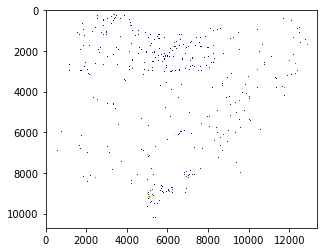

In [0]:
from matplotlib import pyplot
pyplot.imshow(pop_band, cmap='plasma')
pyplot.show()

In [0]:
# check before type casting
assert np.nanmax(labels_band) == np.nanmax(labels_band.astype(np.int64))
assert np.nanmax(mask_band) == np.nanmax(mask_band.astype(np.uint8))
# labels_band = labels_band.astype(np.int64)
mask_band = mask_band.astype(np.uint8)

In [0]:
shapes, pop = [], []
for shape_, pop_ in features.shapes(source=pop_band,
                                    mask=mask_band,
                                    transform=transform):
#     print(f"Total population:{pop_:.1f} Geometry:")
#     pprint.pprint(shape_)
    shapes.append(shape_)
    pop.append(pop_)

len(shapes)

13480

In [0]:
from shapely import geometry

polygons = ({'properties': {'total_pop': pop[i]}, 'geometry': geometry.shape(v)}
            for i,v in enumerate(shapes))

polygons = list(polygons)

In [0]:
gdf = gpd.GeoDataFrame.from_features(polygons)
gdf['centroid'] = gdf.geometry.centroid
gdf

,geometry,total_pop,centroid
0,"POLYGON ((5.48497 13.86603, 5.48497 13.86513, ...",2758.399902,POINT (5.48835 13.86125)
1,"POLYGON ((5.55414 13.86603, 5.55414 13.86513, ...",4082.208008,POINT (5.55735 13.86037)
2,"POLYGON ((5.44634 13.84986, 5.44634 13.84627, ...",680.352966,POINT (5.44794 13.84807)
3,"POLYGON ((5.58019 13.85435, 5.58019 13.85346, ...",4034.116943,POINT (5.58375 13.84792)
4,"POLYGON ((5.44185 13.83369, 5.44185 13.83279, ...",2592.518066,POINT (5.44337 13.82842)
...,...,...,...
13475,"POLYGON ((7.43431 4.74723, 7.43431 4.74454, 7....",403.084991,POINT (7.43555 4.74577)
13476,"POLYGON ((7.51157 4.74184, 7.51157 4.74095, 7....",8466.343750,POINT (7.51270 4.73524)
13477,"POLYGON ((7.41545 4.73735, 7.41545 4.73645, 7....",4261.744141,POINT (7.41811 4.73261)
13478,"POLYGON ((7.44689 4.72837, 7.44689 4.72747, 7....",2318.382080,POINT (7.44841 4.72404)


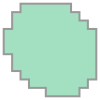

In [0]:
# plot sample
gdf.geometry[0]

# Sorted table

In [0]:
# sort and display links
cols = ['centroid', 'total_pop', 'gmap']
gdf.sort_values(by='total_pop', ascending=False, inplace=True)
gdf['gmap'] = gdf.centroid.apply(lambda p: f'https://google.com/maps/?q={p.y},{p.x}')
gdf[cols].head(15).style.format({'gmap': lambda l: f'<a href="{l}" target="_blank">open map</a>'})

,centroid,total_pop,gmap
13219,POINT (7.266019871949054 5.5929435489657),92469.2,open map
13182,POINT (7.194957884990669 5.649236895621952),82759.7,open map
10930,POINT (8.358032317266513 8.396176645883422),82417.5,open map
13084,POINT (7.147351497357879 5.783113038795849),76103.9,open map
11393,POINT (5.728949340123087 7.746931746498308),67766.2,open map
12329,POINT (8.914222451579219 6.689797396249313),64001.8,open map
10929,POINT (8.551452530685957 8.39994393831053),58141.7,open map
11596,POINT (7.169108761789281 7.50066662397812),49974.4,open map
13019,POINT (7.428513630580123 5.834766986351653),49934.3,open map
13152,POINT (7.261319776186792 5.678173976528937),47766.7,open map


# Map

In [0]:
# Create a map using Stamen Terrain, centered on study area with set zoom level
m = folium.Map(location=[8.06, 8.30], tiles='Stamen Terrain', zoom_start=6)

# Overlay demand polygons
m.add_child(folium.features.GeoJson(gdf.geometry.to_json()))

# Display map
m